In [6]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

# 1 read in ATAC fragments files from cellranger-arc output

In [1]:
# specifiy fragments directories

IX_1_dir = '/staging/leuven/stg_00171/Mark/IX_snMOseq_analysis/CellRangerARC-2.0.2_count_mergedPeaks/MAL001_outs/IX_CellrangerARC_octvul_MAL001/outs/'
IX_2_dir = '/staging/leuven/stg_00171/Mark/IX_snMOseq_analysis/CellRangerARC-2.0.2_count_mergedPeaks/MAL002_outs/IX_CellrangerARC_octvul_MAL002/outs/'

XII_1_dir = '/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/CellRangerARC-2.0.2_count_mergedPeaks/counts_out_ESE001/CellrangerARC_octvul_mergedPeaks/outs/'
XII_2_dir = '/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/CellRangerARC-2.0.2_count_mergedPeaks/counts_out_ESE002/CellrangerARC_octvul_Apr17/outs/'
XII_3_dir = '/staging/leuven/stg_00171/Mark/XII_snMOseq_2022-12-13/CellRangerARC-2.0.2_count_mergedPeaks/counts_out_ESE003/CellrangerARC_octvul_Apr17/outs/'

In [2]:
# Path to fragments
fragments_dict = {'IX_1': IX_1_dir + 'atac_fragments.tsv.gz',
                  'IX_2': IX_2_dir + 'atac_fragments.tsv.gz',
                  'XII_1': XII_1_dir + 'atac_fragments.tsv.gz',
                  'XII_2': XII_2_dir + 'atac_fragments.tsv.gz',
                  'XII_3': XII_3_dir + 'atac_fragments.tsv.gz'
                  } 

# 2 read files like chromsizes, and annotation dataframe from snRNAseq

In [3]:
import pandas as pd
chromsizes = pd.read_table('/staging/leuven/stg_00171/Mark/papero/pycistopic/chromsizes_edit.tsv', sep='\t')
chromsizes

,Chromosome,Start,End
0,NC_006353.1,0,15746
1,xcOctVulg1.1_chr01,0,225692979
2,xcOctVulg1.1_chr02,0,215602707
3,xcOctVulg1.1_chr03,0,182420136
4,xcOctVulg1.1_chr04,0,176733962
...,...,...,...
222,xcOctVulg1.1_scaffold239,0,1078
223,xcOctVulg1.1_scaffold240,0,1059
224,xcOctVulg1.1_scaffold241,0,1035
225,xcOctVulg1.1_scaffold242,0,1018


In [5]:
import pandas as pd

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
annotation = pd.read_csv(outDir + 'annotation.csv', sep=',', index_col=0)

annotation = annotation.drop(annotation[annotation['batch'] == 'XV'].index)
annotation = annotation.drop(annotation[annotation['batch_init'] == 'IX_3'].index)

annotation.index=annotation.index.str.replace("-IX_1", "-IX_1___IX_1")
annotation.index=annotation.index.str.replace("-IX_2", "-IX_2___IX_2")
annotation.index=annotation.index.str.replace("-XII_1", "-XII_1___XII_1")
annotation.index=annotation.index.str.replace("-XII_2", "-XII_2___XII_2")
annotation.index=annotation.index.str.replace("-XII_3", "-XII_3___XII_3")
annotation = pd.DataFrame(annotation)
annotation

,batch,batch_init,coarse_anno
barcode,,,
GCTTACCTCACCATTT-1-IX_1___IX_1,IX,IX_1,NPROG
CGTTGCAAGCTATTAG-1-IX_1___IX_1,IX,IX_1,MES
TACGTTAAGGGTCCAC-1-IX_1___IX_1,IX,IX_1,RET
CTAACCTGTAGCTGGT-1-IX_1___IX_1,IX,IX_1,RET
CGGATAAAGTTACCGG-1-IX_1___IX_1,IX,IX_1,EPI
...,...,...,...
CCCTAATGTGCTCACC-1-XII_1___XII_1,XII,XII_1,NDIFF
CTGGCTTTCCCGTTGT-1-XII_2___XII_2,XII,XII_2,NPROG
TACAGCTAGGTAAGCA-1-XII_2___XII_2,XII,XII_2,MES


# 3 psuedobulk and peak calling

In [7]:
#### getting pseudobulk files
from pycisTopic.pseudobulk_peak_calling import *

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

bw_paths, bed_paths = export_pseudobulk(input_data = annotation,
                 variable = variable,
                 sample_id_col = 'batch_init',
                 chromsizes = chromsizes,
                 bed_path = outDir + f'consensus_peak_calling/{variable}_pseudobulk_bed_files/',
                 bigwig_path = outDir + f'consensus_peak_calling/{variable}_pseudobulk_bw_files/',
                 path_to_fragments = fragments_dict,
                 n_cpu = 50,
                 normalize_bigwig = True,
                 #remove_duplicates = True,
                 #_temp_dir = tmpDir + 'ray_spill',
                 split_pattern = '-')

#### save the pseudobulk files for each cluster
import pickle 
with open(outDir + f'consensus_peak_calling/{variable}_pseudobulk_bed_files/bed_paths.pkl', 'wb') as f:
  pickle.dump(bed_paths, f)
  
import pickle
with open(outDir + f'consensus_peak_calling/{variable}_pseudobulk_bw_files/bw_paths.pkl', 'wb') as f:
  pickle.dump(bw_paths, f)

2025-12-17 10:54:04,234 cisTopic     INFO     Splitting fragments by cell type.
2025-12-17 10:56:21,823 cisTopic     INFO     generating bigwig files


In [8]:
import os
import pickle

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

bed_paths = pickle.load(open(os.path.join(outDir + f'consensus_peak_calling/{variable}_pseudobulk_bed_files/bed_paths.pkl'), 'rb'))
bw_paths =  pickle.load(open(os.path.join(outDir + f'consensus_peak_calling/{variable}_pseudobulk_bw_files/bw_paths.pkl'), 'rb'))

from pycisTopic.pseudobulk_peak_calling import peak_calling
macs_path='/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/bin/macs2'

# Run peak calling
narrow_peaks_dict = peak_calling(macs_path,
                                 bed_paths,
                                 os.path.join(outDir + f'consensus_peak_calling/{variable}_MACS/'),
                                 genome_size='hs',
                                 n_cpu=50,
                                 input_format='BEDPE',
                                 shift=73,
                                 ext_size=146,
                                 keep_dup = 'all',
                                 q_value = 0.05,
                                 #_temp_dir = tmpDir + 'ray_spill'
                                )

## save the narrow peaks dictionary (with a PyRanges with the narrow peaks for each cell type)
import pickle 
with open(outDir + f'consensus_peak_calling/{variable}_MACS/narrow_peaks_dict.pkl', 'wb') as f:
  pickle.dump(narrow_peaks_dict, f)

2025-12-17 11:00:42,970	INFO worker.py:1724 -- Started a local Ray instance.


(macs_call_peak_ray pid=4067994) 2025-12-17 11:00:46,130 cisTopic     INFO     Calling peaks for NPROG with /data/leuven/347/vsc34794/miniconda3/envs/scenicplus/bin/macs2 callpeak --treatment /staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/consensus_peak_calling/coarse_anno_pseudobulk_bed_files/NPROG.fragments.tsv.gz --name NPROG  --outdir /staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/consensus_peak_calling/coarse_anno_MACS/ --format BEDPE --gsize hs --qvalue 0.05 --nomodel --shift 73 --extsize 146 --keep-dup all --call-summits --nolambda
(macs_call_peak_ray pid=4067996) 2025-12-17 11:00:46,131 cisTopic     INFO     Calling peaks for EPI with /data/leuven/347/vsc34794/miniconda3/envs/scenicplus/bin/macs2 callpeak --treatment /staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/consensus_peak_calling/coarse_anno_pseudobulk_bed_files/EPI.fragments.tsv.gz --name EPI  --outdir /staging/leuven/stg_00171/Mark/IX_XII_MP_integra

In [9]:
## derive consensus peaks with TGCA iterative peak filtering approach
from pycisTopic.iterative_peak_calling import *

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'


# Other param
peak_half_width=250
# Get consensus peaks
consensus_peaks=get_consensus_peaks(narrow_peaks_dict, peak_half_width, chromsizes=chromsizes) 

# Write to bed
consensus_peaks.to_bed(path= outDir + f'consensus_peak_calling/{variable}_consensus_regions.bed', keep=True, compression='infer', chain=False)

2025-12-17 11:09:08,524 cisTopic     INFO     Extending and merging peaks per class
2025-12-17 11:10:11,359 cisTopic     INFO     Normalizing peak scores
2025-12-17 11:10:11,688 cisTopic     INFO     Merging peaks
Warning! Start and End columns now have different dtypes: int64 and int32
2025-12-17 11:11:03,134 cisTopic     INFO     Done!


/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  return pd.concat([outdf, df.get(noncanonical)], axis=1)
/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  return pd.concat([outdf, df.get(noncanonical)], axis=1)
/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  return pd.concat([outdf, df.get(noncanonical)], axis=1)
/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/pyranges/out.py:37: FutureWarning: Passing a set as an indexer is deprecated and will raise in a fu

# 4 prepare gtf for pycistopic format

In [21]:
### run every time
## octopus tss annotation, use the start of the gene 
gtf_file = '/staging/leuven/stg_00171/new_genome/xcOctVulg1.1_MT_fixed_mergedPeaks.gtf'
def _attribute_to_dict(attribute_string):
    d = {}
    for entry in attribute_string.strip().split(';'):
        if entry.strip() == "":
            continue
        parts = entry.strip().split()
        if len(parts) >= 2:
            key = parts[0]
            value = parts[1].strip('"')
            d[key] = value
    return d

In [22]:
def get_tss_from_gtf(gtf_file):
        gtf = pd.read_csv(gtf_file, sep = '\t',
                names = ['seqname', 'source', 'feature', 'start', 'end', 'score', 'strand', 'frame', 'attributes'])
        gtf = gtf.query('feature == "gene"')
        gtf['Start'] = gtf.apply(lambda x: x.start if x.strand == "+" else x.end, axis = 1)
        gtf['Transcript_type'] = gtf['attributes'].apply(lambda x: _attribute_to_dict(x)).apply(lambda x: x['gene_biotype'].replace('"', '') if 'gene_biotype' in x.keys() else np.nan)       
        #gtf = gtf.query('Transcript_type == "protein_coding"')
        gtf['Gene'] = gtf['attributes'].apply(lambda x: _attribute_to_dict(x)).apply(lambda x: x['gene_id'].replace('"', '') if 'gene_id' in x.keys() else np.nan)
        gtf.drop(['source', 'feature', 'score', 'frame', 'attributes'], axis = 1, inplace = True)
        gtf = gtf.loc[:, ['seqname', 'start', 'end', 'strand', 'Gene', 'Start', 'Transcript_type']]
        gtf.columns = ['# Chromosome', 'Start', 'End', 'Strand', 'Gene','Transcription_Start_Site', 'Transcript_type']
        #gtf['Strand'] = gtf['Strand'].apply(lambda x: 1 if x == '+' else -1)
        return gtf

In [23]:
import numpy as np
annot = get_tss_from_gtf(gtf_file)
annot


/tmp/ipykernel_4066947/1686360315.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gtf['Start'] = gtf.apply(lambda x: x.start if x.strand == "+" else x.end, axis = 1)
/tmp/ipykernel_4066947/1686360315.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gtf['Transcript_type'] = gtf['attributes'].apply(lambda x: _attribute_to_dict(x)).apply(lambda x: x['gene_biotype'].replace('"', '') if 'gene_biotype' in x.keys() else np.nan)
/tmp/ipykernel_4066947/1686360315.py:8: SettingWithCopyWarning: 
A value is tryi

,# Chromosome,Start,End,Strand,Gene,Transcription_Start_Site,Transcript_type
1,xcOctVulg1.1_MT,1.0,67.0,+,nbisL1-gene-1,1.0,NaN
4,xcOctVulg1.1_MT,61.0,543.0,-,nbisL1-gene-2,543.0,NaN
7,xcOctVulg1.1_MT,613.0,912.0,-,nbisL1-gene-3,912.0,NaN
10,xcOctVulg1.1_MT,941.0,1007.0,-,nbisL1-gene-4,1007.0,NaN
13,xcOctVulg1.1_MT,1027.0,2330.0,-,nbisL1-gene-5,2330.0,NaN
...,...,...,...,...,...,...,...
1019624,xcOctVulg1.1_scaffold72,769.0,1417.0,-,g.minus_peak_233303,1417.0,NaN
1019627,xcOctVulg1.1_scaffold76,733.0,3793.0,-,OctVul6ncA500276,3793.0,NaN
1019630,xcOctVulg1.1_scaffold120,1646.0,1855.0,-,g.minus_peak_232790,1855.0,NaN
1019633,xcOctVulg1.1_scaffold126,3902.0,4046.0,+,OctVul6ncA498856,3902.0,NaN


In [13]:
annot['Start'] = annot['Start'].astype(int)
annot['End'] = annot['End'].astype(int)
annot["Strand"] = annot["Strand"].astype(str)
annot['Transcription_Start_Site'] = annot['Transcription_Start_Site'].astype(int)

In [14]:
annot[["# Chromosome", "Start", "End", "Strand", "Gene", "Transcription_Start_Site", "Transcript_type"]].to_csv(
    outDir + "tss.bed", sep="\t", header=True, index=False
)

In [15]:
print(outDir + "tss.bed")

/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/tss.bed


In [3]:
import pandas as pd
import pyranges as pr
annot = pd.read_csv('/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/tss.bed', sep="\t")
#annot = pr.PyRanges(annot)

In [5]:
annot['Chromosome'] = annot['# Chromosome']

In [7]:
del(annot['# Chromosome'])

In [9]:
annot = annot[["Chromosome", "Start", "End", "Strand", "Gene", "Transcription_Start_Site"]]
annot

,Chromosome,Start,End,Strand,Gene,Transcription_Start_Site
0,xcOctVulg1.1_MT,1,67,+,nbisL1-gene-1,1
1,xcOctVulg1.1_MT,61,543,-,nbisL1-gene-2,543
2,xcOctVulg1.1_MT,613,912,-,nbisL1-gene-3,912
3,xcOctVulg1.1_MT,941,1007,-,nbisL1-gene-4,1007
4,xcOctVulg1.1_MT,1027,2330,-,nbisL1-gene-5,2330
...,...,...,...,...,...,...
81116,xcOctVulg1.1_scaffold72,769,1417,-,g.minus_peak_233303,1417
81117,xcOctVulg1.1_scaffold76,733,3793,-,OctVul6ncA500276,3793
81118,xcOctVulg1.1_scaffold120,1646,1855,-,g.minus_peak_232790,1855
81119,xcOctVulg1.1_scaffold126,3902,4046,+,OctVul6ncA498856,3902


In [11]:
annot[["Chromosome", "Start", "End", "Strand", "Gene", "Transcription_Start_Site"]].to_csv(
   "/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/tss_scplus.bed", sep="\t", header=True, index=False
)

In [ ]:
# sometimes the column "Chromosome" needs to be "# Chromosome"

## 5 pycistopic QC

In [16]:
import pyranges as pr
import pandas as pd
import numpy as np
import pybiomart as pbm
import os 

In [18]:
#from pycisTopic.qc import * ## remove that command, unless it loads ray
variable = 'coarse_anno'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

path_to_regions = {'IX_1': outDir + f'consensus_peak_calling/{variable}_consensus_regions.bed',
                   'IX_2': outDir + f'consensus_peak_calling/{variable}_consensus_regions.bed',
                   'XII_1':outDir + f'consensus_peak_calling/{variable}_consensus_regions.bed',
                   'XII_2':outDir + f'consensus_peak_calling/{variable}_consensus_regions.bed',
                   'XII_3':outDir + f'consensus_peak_calling/{variable}_consensus_regions.bed'
                   }

In [19]:
variable = 'coarse_anno'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

regions_bed_filename = os.path.join(outDir, f"consensus_peak_calling/{variable}_consensus_regions.bed")
tss_bed_filename = os.path.join(outDir, "tss.bed")

pycistopic_qc_commands_filename = outDir + f"{variable}_pycistopic_qc_commands.txt"

# Create text file with all pycistopic qc command lines.
with open(pycistopic_qc_commands_filename, "w") as fh:
    for sample, fragment_filename in fragments_dict.items():
        print(
            "pycistopic qc",
            f"--fragments {fragment_filename}",
            f"--regions {regions_bed_filename}",
            f"--tss {tss_bed_filename}",
            f"--output {os.path.join(outDir, 'QC')}/{sample}",
            sep=" ",
            file=fh,
        )


In [20]:
print(pycistopic_qc_commands_filename)

/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/coarse_anno_pycistopic_qc_commands.txt


In [ ]:
# don't forget to cite GNU Parallel

Academic tradition requires you to cite works you base your article on.
If you use programs that use GNU Parallel to process data for an article in a
scientific publication, please cite:

  O. Tange (2018): GNU Parallel 2018, Mar 2018, ISBN 9781387509881,
  DOI https://doi.org/10.5281/zenodo.1146014

This helps funding further development; AND IT WON'T COST YOU A CENT.
If you pay 10000 EUR you should feel free to use GNU Parallel without citing.

More about funding GNU Parallel and the citation notice:
https://www.gnu.org/software/parallel/parallel_design.html#Citation-notice

To silence this citation notice: run 'parallel --citation' once.

Come on: You have run parallel 11 times. Isn't it about time 
you run 'parallel --citation' once to silence the citation notice?

In [24]:
from pycisTopic.plotting.qc_plot import plot_sample_stats, plot_barcode_stats
import matplotlib.pyplot as plt

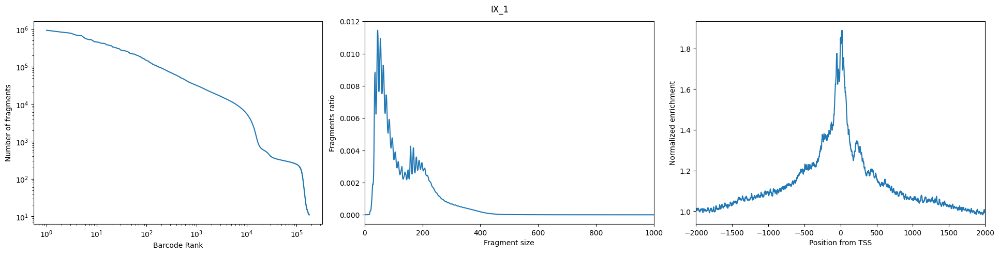

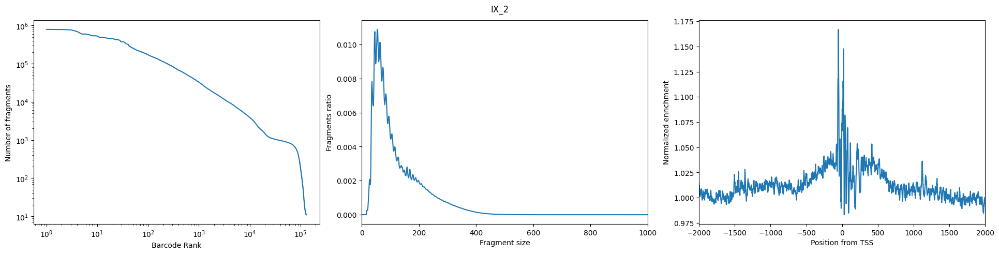

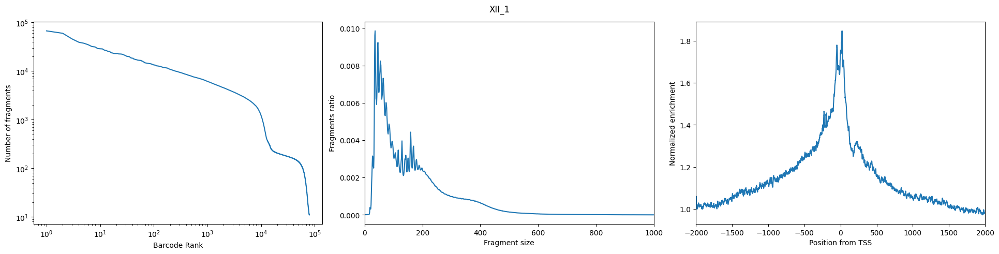

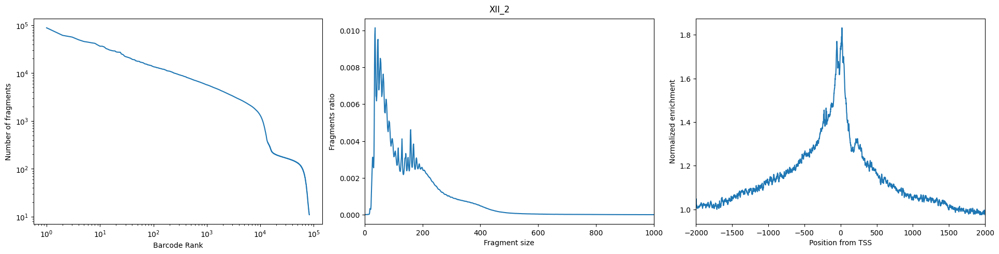

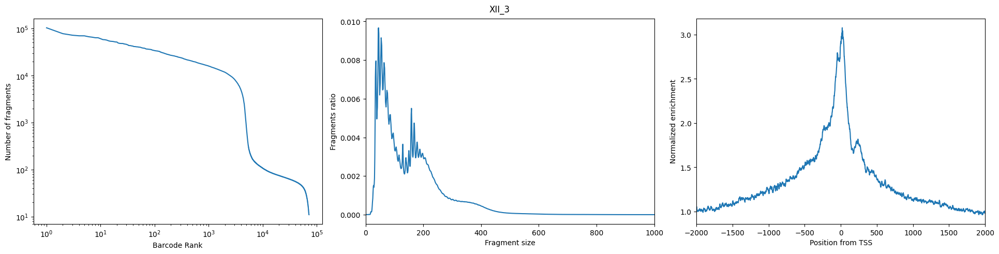

In [48]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

for sample_id in fragments_dict:
    fig = plot_sample_stats(
        sample_id = sample_id,
        pycistopic_qc_output_dir = outDir + "QC",
        save='figures/paper/Figure 2/pycistopic_QC_1.png'
    )


In [26]:
from pycisTopic.qc import get_barcodes_passing_qc_for_sample
sample_id_to_barcodes_passing_filters = {}
sample_id_to_thresholds = {}
for sample_id in fragments_dict:
    (
        sample_id_to_barcodes_passing_filters[sample_id],
        sample_id_to_thresholds[sample_id]
    ) = get_barcodes_passing_qc_for_sample(
            sample_id = sample_id,
            pycistopic_qc_output_dir = outDir + "QC",
            unique_fragments_threshold = 500, 
            tss_enrichment_threshold = 1.5,
            frip_threshold = 0,
            use_automatic_thresholds = True,
    )

IX_1:
	Using user-defined threshold for unique fragments: 500
	Using user-defined threshold for TSS enrichment: 1.5
IX_2:
	Using user-defined threshold for unique fragments: 500
	Using user-defined threshold for TSS enrichment: 1.5
XII_1:
	Using user-defined threshold for unique fragments: 500
	Using user-defined threshold for TSS enrichment: 1.5
XII_2:
	Using user-defined threshold for unique fragments: 500
	Using user-defined threshold for TSS enrichment: 1.5
XII_3:
	Using user-defined threshold for unique fragments: 500
	Using user-defined threshold for TSS enrichment: 1.5


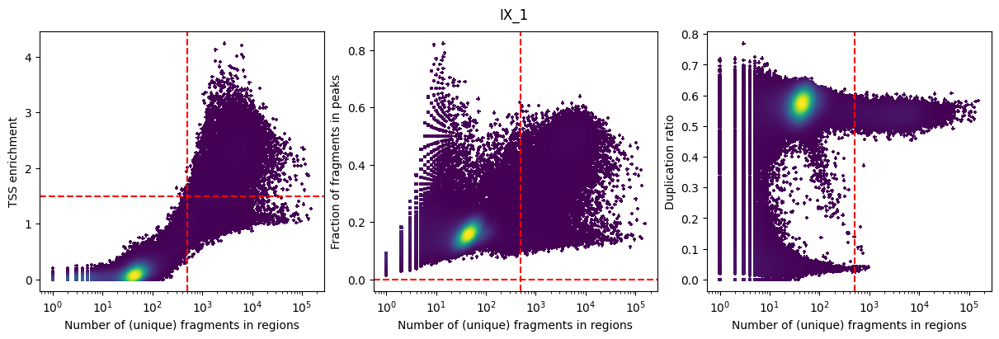

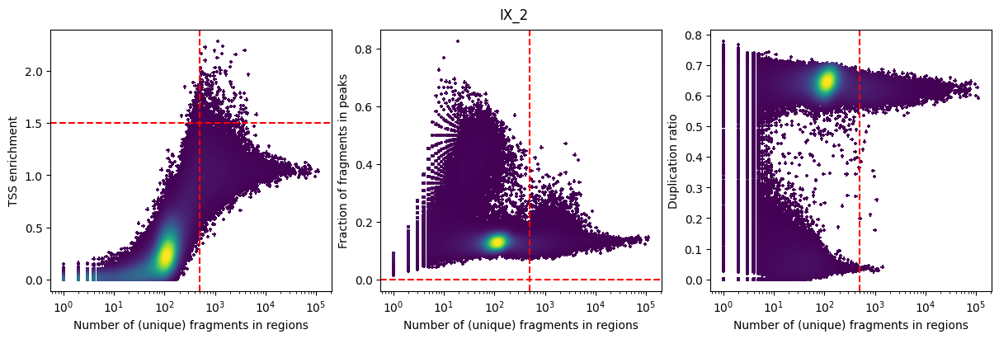

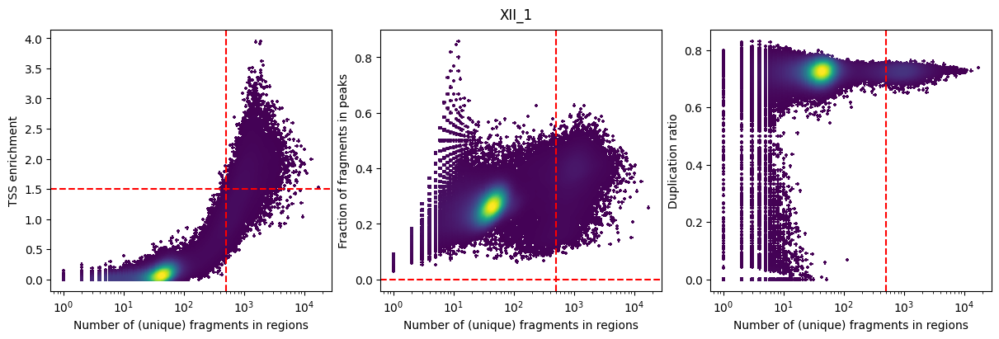

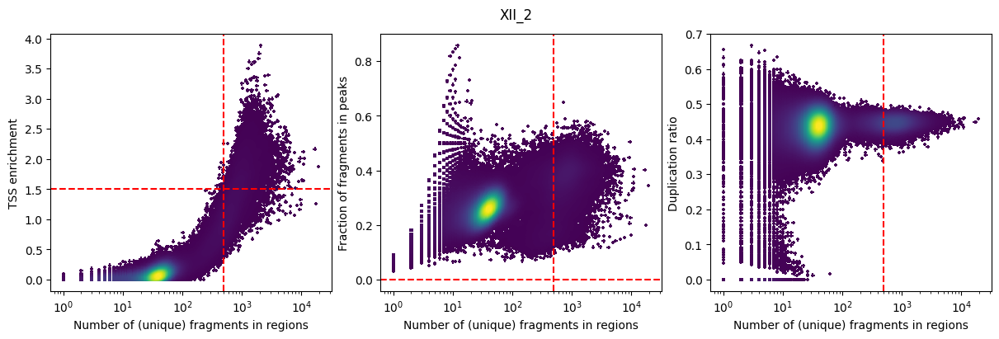

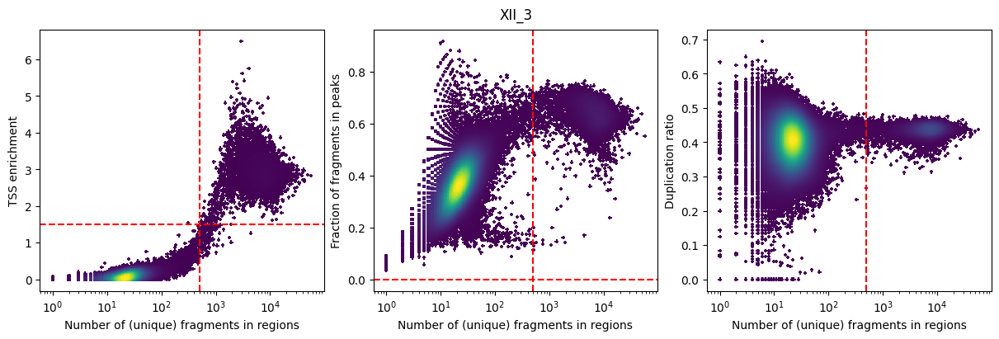

In [47]:
for sample_id in fragments_dict:
    fig = plot_barcode_stats(
        sample_id = sample_id,
        pycistopic_qc_output_dir = outDir + "QC",
        bc_passing_filters = sample_id_to_barcodes_passing_filters[sample_id],
        detailed_title = False,
        **sample_id_to_thresholds[sample_id],
        save='figures/paper/Figure 2/pycistopic_QC_2.png'
    )

# 5 create cistopic object based on coarse_anno

In [29]:
import os
import pickle

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

path_to_regions = os.path.join(outDir, f"consensus_peak_calling/{variable}_consensus_regions.bed")
# path_to_blacklist = "pycisTopic/blacklist/hg38-blacklist.v2.bed"
pycistopic_qc_output_dir = outDir + "QC"

from pycisTopic.cistopic_class import create_cistopic_object_from_fragments
import polars as pl

cistopic_obj_list = []
for sample_id in fragments_dict:
    sample_metrics = pl.read_parquet(
        os.path.join(pycistopic_qc_output_dir, f'{sample_id}.fragments_stats_per_cb.parquet')
    ).to_pandas().set_index("CB").loc[ sample_id_to_barcodes_passing_filters[sample_id] ]
    cistopic_obj = create_cistopic_object_from_fragments(
        path_to_fragments = fragments_dict[sample_id],
        path_to_regions = path_to_regions,
        # path_to_blacklist = path_to_blacklist,
        metrics = sample_metrics,
        valid_bc = sample_id_to_barcodes_passing_filters[sample_id],
        n_cpu = 50,
        project = sample_id,
        split_pattern = '-'
    )
    cistopic_obj_list.append(cistopic_obj)
    
from pycisTopic.cistopic_class import CistopicObject, merge
cistopic_obj = merge(cistopic_obj_list)

pickle.dump(
    cistopic_obj,
    open(os.path.join(outDir, f"{variable}_cistopic_obj.pkl"), "wb")
)


2025-12-17 12:47:08,468 cisTopic     INFO     Reading data for IX_1
2025-12-17 12:49:37,643 cisTopic     INFO     metrics provided!
2025-12-17 12:49:45,988 cisTopic     INFO     Counting fragments in regions


2025-12-17 12:49:48,479	INFO worker.py:1724 -- Started a local Ray instance.


2025-12-17 12:50:16,779 cisTopic     INFO     Creating fragment matrix


/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 4356339037 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-17 12:54:44,439 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-17 12:55:01,729 cisTopic     INFO     Creating CistopicObject
2025-12-17 12:55:03,051 cisTopic     INFO     Done!
2025-12-17 12:55:04,099 cisTopic     INFO     Reading data for IX_2
2025-12-17 12:57:42,483 cisTopic     INFO     metrics provided!
2025-12-17 12:57:46,672 cisTopic     INFO     Counting fragments in regions


2025-12-17 12:57:50,922	INFO worker.py:1724 -- Started a local Ray instance.


2025-12-17 12:58:08,585 cisTopic     INFO     Creating fragment matrix
2025-12-17 12:58:09,433 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-17 12:58:09,816 cisTopic     INFO     Creating CistopicObject
2025-12-17 12:58:10,028 cisTopic     INFO     Done!
2025-12-17 12:58:10,774 cisTopic     INFO     Reading data for XII_1
2025-12-17 12:58:38,192 cisTopic     INFO     metrics provided!
2025-12-17 12:58:39,681 cisTopic     INFO     Counting fragments in regions


2025-12-17 12:58:44,493	INFO worker.py:1724 -- Started a local Ray instance.


2025-12-17 12:59:01,645 cisTopic     INFO     Creating fragment matrix


/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 2257224422 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-17 12:59:13,599 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-17 12:59:21,376 cisTopic     INFO     Creating CistopicObject
2025-12-17 12:59:21,903 cisTopic     INFO     Done!
2025-12-17 12:59:22,955 cisTopic     INFO     Reading data for XII_2
2025-12-17 12:59:49,539 cisTopic     INFO     metrics provided!
2025-12-17 12:59:50,949 cisTopic     INFO     Counting fragments in regions


2025-12-17 12:59:54,698	INFO worker.py:1724 -- Started a local Ray instance.


2025-12-17 13:00:09,509 cisTopic     INFO     Creating fragment matrix
2025-12-17 13:00:20,657 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-17 13:00:27,520 cisTopic     INFO     Creating CistopicObject
2025-12-17 13:00:28,024 cisTopic     INFO     Done!
2025-12-17 13:00:28,740 cisTopic     INFO     Reading data for XII_3
2025-12-17 13:01:01,266 cisTopic     INFO     metrics provided!
2025-12-17 13:01:03,281 cisTopic     INFO     Counting fragments in regions


2025-12-17 13:01:07,234	INFO worker.py:1724 -- Started a local Ray instance.


2025-12-17 13:01:27,560 cisTopic     INFO     Creating fragment matrix


/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/pycisTopic/cistopic_class.py:886: PerformanceWarning: The following operation may generate 2186926551 cells in the resulting pandas object.
  .unstack(level="Name", fill_value=0)


2025-12-17 13:02:27,666 cisTopic     INFO     Converting fragment matrix to sparse matrix
2025-12-17 13:02:36,322 cisTopic     INFO     Creating CistopicObject
2025-12-17 13:02:37,286 cisTopic     INFO     Done!
2025-12-17 13:02:40,719 cisTopic     INFO     cisTopic object 1 merged
2025-12-17 13:02:44,420 cisTopic     INFO     cisTopic object 2 merged
2025-12-17 13:02:48,363 cisTopic     INFO     cisTopic object 3 merged
2025-12-17 13:02:53,133 cisTopic     INFO     cisTopic object 4 merged


# 6 add the cluster annotation from the snRNAseq to the cistopic object

In [33]:
common_barcodes = annotation.index.intersection(cistopic_obj.cell_data.index)
common_barcodes

Index(['GCTTACCTCACCATTT-1-IX_1___IX_1', 'CGTTGCAAGCTATTAG-1-IX_1___IX_1',
       'TACGTTAAGGGTCCAC-1-IX_1___IX_1', 'CTAACCTGTAGCTGGT-1-IX_1___IX_1',
       'CGGATAAAGTTACCGG-1-IX_1___IX_1', 'GTGCATTAGCATCCAG-1-IX_1___IX_1',
       'AGTTATGTCGCTCACT-1-IX_1___IX_1', 'GTTAGGCGTAGCCTCC-1-IX_1___IX_1',
       'GCACTAAGTGACCTGG-1-IX_1___IX_1', 'CAGATTCAGTCACGAT-1-IX_1___IX_1',
       ...
       'CAGTACCCACGGTTTA-1-XII_2___XII_2', 'CCTGTAACACAACAAA-1-XII_3___XII_3',
       'CATGCAAGTGGAAACG-1-XII_3___XII_3', 'TCCTTAGTCAAACTCA-1-XII_1___XII_1',
       'CGGTGAACATAGCGGA-1-XII_1___XII_1', 'GAACCGCTCGATAACC-1-XII_2___XII_2',
       'GCCCTCATCGCACAAT-1-XII_3___XII_3', 'AGTATAGCACCTCGCT-1-XII_2___XII_2',
       'CCCTAATGTGCTCACC-1-XII_1___XII_1', 'GAGGCCTTCCTCACTA-1-XII_2___XII_2'],
      dtype='object', length=14222)

In [37]:
cistopic_obj.cell_data = cistopic_obj.cell_data.join(annotation[['coarse_anno', 'batch']], how='left')

In [41]:
annotation['coarse_anno'].value_counts()

NDIFF    11062
MES       9791
EPI       4917
NPROG     3876
RET       1859
GLIA      1804
ENDOT      246
Name: coarse_anno, dtype: int64

In [40]:
cistopic_obj.cell_data['coarse_anno'].value_counts()

NDIFF    5175
MES      3708
EPI      1857
NPROG    1660
GLIA      903
RET       836
ENDOT      83
Name: coarse_anno, dtype: int64

In [42]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

pickle.dump(
    cistopic_obj,
    open(os.path.join(outDir, f"{variable}_cistopic_obj.pkl"), "wb")
)

# 7 create cistopic object with matching barcodes for SCENIC+ analysis

In [44]:
cistopic_obj_filtered = cistopic_obj.subset(common_barcodes, copy=True)

In [45]:
cistopic_obj_filtered.cell_data

,cisTopic_nr_frag,cisTopic_log_nr_frag,cisTopic_nr_acc,cisTopic_log_nr_acc,sample_id,barcode_rank,total_fragments_count,log10_total_fragments_count,unique_fragments_count,log10_unique_fragments_count,...,duplication_count,duplication_ratio,nucleosome_signal,tss_enrichment,pdf_values_for_tss_enrichment,pdf_values_for_fraction_of_fragments_in_peaks,pdf_values_for_duplication_ratio,barcode,coarse_anno,batch
GCTTACCTCACCATTT-1-IX_1___IX_1,4625,3.665112,4072,3.609808,IX_1,6325,20236,4.306146,9600,3.982316,...,10636,0.525598,0.566012,2.217559,0.052049,0.350667,0.874842,GCTTACCTCACCATTT-1,NPROG,IX
CGTTGCAAGCTATTAG-1-IX_1___IX_1,1952,3.29048,1836,3.263873,IX_1,11164,9831,3.992642,4570,3.660011,...,5261,0.535144,0.600451,2.802892,0.008368,0.166585,0.759662,CGTTGCAAGCTATTAG-1,MES,IX
TACGTTAAGGGTCCAC-1-IX_1___IX_1,5196,3.715669,4686,3.670802,IX_1,6023,21572,4.333911,10050,4.002209,...,11522,0.534118,0.506365,1.971517,0.044850,0.354385,0.914808,TACGTTAAGGGTCCAC-1,RET,IX
CTAACCTGTAGCTGGT-1-IX_1___IX_1,7000,3.845098,6072,3.783332,IX_1,4396,27320,4.436497,12726,4.104726,...,14594,0.534187,0.468685,3.022448,0.011300,0.248547,0.776603,CTAACCTGTAGCTGGT-1,RET,IX
CGGATAAAGTTACCGG-1-IX_1___IX_1,2799,3.447003,2613,3.417139,IX_1,7309,18853,4.275404,8351,3.921790,...,10502,0.557047,0.636115,1.665907,0.032247,0.149428,0.665465,CGGATAAAGTTACCGG-1,EPI,IX
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
GAACCGCTCGATAACC-1-XII_2___XII_2,848,2.928396,820,2.913814,XII_2,5542,4293,3.632862,2355,3.372175,...,1938,0.451433,0.598437,1.682207,0.150569,0.871501,3.915850,GAACCGCTCGATAACC-1,RET,XII
GCCCTCATCGCACAAT-1-XII_3___XII_3,3129,3.495406,2998,3.476832,XII_3,4035,8164,3.911956,4595,3.662380,...,3569,0.437163,0.587040,3.137245,0.028488,0.284543,0.967865,GCCCTCATCGCACAAT-1,MES,XII
AGTATAGCACCTCGCT-1-XII_2___XII_2,1434,3.156549,1390,3.143015,XII_2,2730,6285,3.798374,3510,3.545431,...,2775,0.441527,0.667579,2.291099,0.058836,0.721942,2.294419,AGTATAGCACCTCGCT-1,NDIFF,XII
CCCTAATGTGCTCACC-1-XII_1___XII_1,2463,3.391464,2314,3.364363,XII_1,924,22811,4.358163,6368,3.804071,...,16443,0.720836,0.543069,1.758859,0.054543,0.290398,1.024001,CCCTAATGTGCTCACC-1,NDIFF,XII


In [46]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

pickle.dump(
    cistopic_obj_filtered,
    open(os.path.join(outDir, f"{variable}_cistopic_obj_adata_bc_subset.pkl"), "wb")
)

In [43]:
print(os.path.join(outDir, f"{variable}_cistopic_obj.pkl"))

/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/coarse_anno_cistopic_obj.pkl


# 8 topic modelling

In [ ]:
import pycisTopic
from pycisTopic.lda_models import run_cgs_models
import os
import pickle

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

infile = open(outDir + f"{variable}_bc_subset_cistopic_obj_qc.pkl", 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

models=run_cgs_models(
    cistopic_obj,
    n_topics=[5,10,15,20,25,30,35],
    n_cpu=1,
    n_iter=150,
    random_state=33,
    alpha=50,
    alpha_by_topic=True,
    eta=0.1,
    eta_by_topic=False,
    save_path=outDir + 'topic_modelling/bc_subset_qc/'
)


# 9 take 30 topics for QC check, see if there are low quality clusters based on low tss enrichment 

In [16]:
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

import pickle
infile = open(outDir + f"{variable}_cistopic_obj.pkl", 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

In [17]:
import pickle
infile = open(outDir + 'topic_modelling/Topic30.pkl', 'rb')
Topic30 = pickle.load(infile)
infile.close()

In [18]:
cistopic_obj.add_LDA_model(Topic30)

In [19]:
from pycisTopic.clust_vis import harmony
harmony(cistopic_obj, 
        'sample_id',
        scale = True,
        random_state = 33,
        max_iter_harmony=30)

2025-12-19 11:39:05,108 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-12-19 11:39:06,118 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-12-19 11:39:06,169 - harmonypy - INFO - Iteration 1 of 30
2025-12-19 11:39:09,145 - harmonypy - INFO - Iteration 2 of 30
2025-12-19 11:39:12,136 - harmonypy - INFO - Iteration 3 of 30
2025-12-19 11:39:15,123 - harmonypy - INFO - Iteration 4 of 30
2025-12-19 11:39:18,108 - harmonypy - INFO - Iteration 5 of 30
2025-12-19 11:39:21,100 - harmonypy - INFO - Converged after 5 iterations


In [20]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)

In [21]:
find_clusters(
    cistopic_obj,
    harmony = True,
    target  = 'cell',
    k = 10,
    res = [0.1, 0.3, 0.5, 1.0, 2.0],
    prefix = 'pycisTopic_',
    scale = True,
    split_pattern = '-'
)

2025-12-19 11:39:23,554 cisTopic     INFO     Finding neighbours


In [22]:
run_umap(
    cistopic_obj,
    target  = 'cell', scale=True, 
    reduction_name = 'UMAP_HARM',
    harmony=True,
    verbose=False
)

2025-12-19 11:39:32,542 cisTopic     INFO     Running UMAP


/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


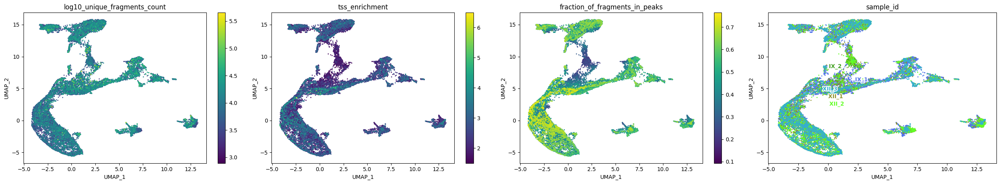

In [23]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['log10_unique_fragments_count', 'tss_enrichment', 'fraction_of_fragments_in_peaks', 'sample_id'],
    target='cell', num_columns=4,
    text_size=10,
    save='figures/paper/Figure 2/supp_UMAP_QC_values.png',
    dot_size=1)

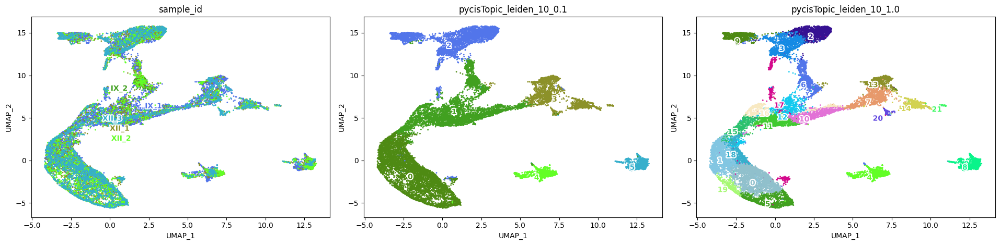

In [25]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['sample_id', 'pycisTopic_leiden_10_0.1', 'pycisTopic_leiden_10_1.0'],
    target='cell', 
    num_columns=4,
    text_size=10,
    dot_size=1)

In [27]:
variable = 'coarse_anno'

annot_dict = {}
for resolution in [0.1, 0.3, 0.5, 1.0]:
    annot_dict[f"pycisTopic_leiden_10_{resolution}"] = {}
    for cluster in set(cistopic_obj.cell_data[f"pycisTopic_leiden_10_{resolution}"]):
        counts = cistopic_obj.cell_data.loc[
            cistopic_obj.cell_data.loc[cistopic_obj.cell_data[f"pycisTopic_leiden_10_{resolution}"] == cluster].index,
            variable].value_counts()
        annot_dict[f"pycisTopic_leiden_10_{resolution}"][cluster] = f"{counts.index[counts.argmax()]}({cluster})"


In [28]:
for resolution in [0.1, 0.3, 0.5, 1.0]:
    cistopic_obj.cell_data[f'pycisTopic_leiden_10_{resolution}'] = [
        annot_dict[f'pycisTopic_leiden_10_{resolution}'][x] for x in cistopic_obj.cell_data[f'pycisTopic_leiden_10_{resolution}'].tolist()
    ]


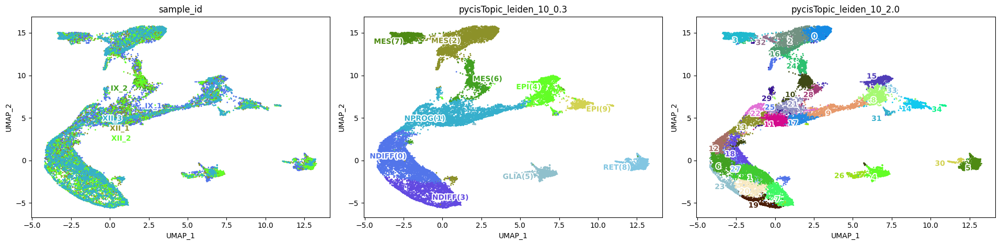

In [29]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['sample_id', 'pycisTopic_leiden_10_0.3', 'pycisTopic_leiden_10_2.0'],
    target='cell', 
    num_columns=4,
    text_size=10,
    dot_size=1,
    save='figures/paper/Figure 2/supp_UMAP_QC_leiden.png',
)

# 10 overclustering with resolution 2.0
remove clusters with low tss enrichment and low fraction of fragments in peaks

In [30]:
import pandas as pd

qc_df = cistopic_obj.cell_data[[
    'pycisTopic_leiden_10_2.0',
    'tss_enrichment',
    'fraction_of_fragments_in_peaks'
]].copy()

qc_df.rename(columns={
    'pycisTopic_leiden_10_2.0': 'cluster'
}, inplace=True)


In [31]:
qc_cluster = (
    qc_df
    .groupby('cluster')
    .agg({
        'tss_enrichment': 'mean',
        'fraction_of_fragments_in_peaks': 'mean'
    })
)


In [32]:
qc_cluster['n_cells'] = qc_df.groupby('cluster').size()


In [33]:
qc_cluster

,tss_enrichment,fraction_of_fragments_in_peaks,n_cells
cluster,,,
0,2.227353,0.466291,1560
1,2.338944,0.498311,1540
10,1.678420,0.189774,937
11,2.436631,0.486272,867
12,2.253740,0.465589,865
13,2.307055,0.458740,847
14,2.251077,0.454143,786
15,2.367501,0.458865,742
16,2.419894,0.498275,718


2025-12-19 11:49:16,857 matplotlib.category INFO     Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-12-19 11:49:16,859 matplotlib.category INFO     Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


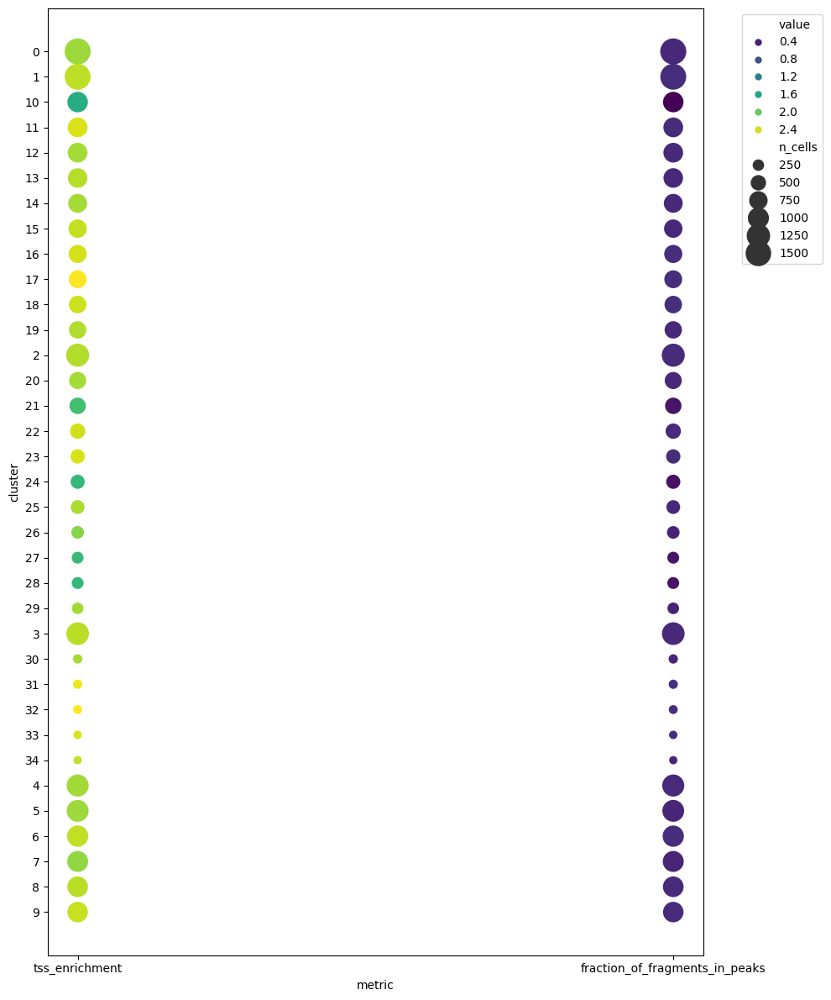

In [65]:
import matplotlib.pyplot as plt
import seaborn as sns

qc_long = qc_cluster.reset_index().melt(
    id_vars=['cluster', 'n_cells'],
    value_vars=['tss_enrichment', 'fraction_of_fragments_in_peaks'],
    var_name='metric',
    value_name='value'
)

plt.figure(figsize=(10, 12))

sns.scatterplot(
    data=qc_long,
    x='metric',
    y='cluster',
    size='n_cells',
    hue='value',
    palette='viridis',
    sizes=(50, 500),
    edgecolor='none'
)

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig('figures/paper/Figure 2/tsse_FRIPs_qc.pdf', dpi=300)
plt.show()


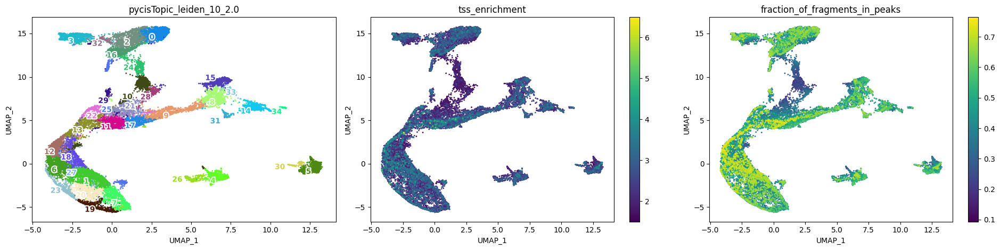

In [43]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['pycisTopic_leiden_10_2.0', 'tss_enrichment', 'fraction_of_fragments_in_peaks'],
    target='cell', 
    num_columns=4,
    text_size=10,
    dot_size=1,
    #save='figures/paper/Figure 2/supp_UMAP_QC_leiden.png',
)

In [44]:
tss_thresh = 2.0
frip_thresh = 0.2


In [45]:
bad_clusters = qc_cluster.index[
    (qc_cluster['tss_enrichment'] < tss_thresh) |
    (qc_cluster['fraction_of_fragments_in_peaks'] < frip_thresh)
].tolist()

print("Clusters to remove:", bad_clusters)


Clusters to remove: ['10', '21', '24', '27', '28']


In [39]:
cistopic_obj_qc = cistopic_obj


In [53]:
cells_to_keep = (
    ~cistopic_obj.cell_data['pycisTopic_leiden_10_2.0'].isin(bad_clusters)
)

In [56]:
cells_to_keep_real = cells_to_keep[cells_to_keep == True]

In [58]:
len(cells_to_keep)

23970

In [57]:
len(cells_to_keep_real)

21498

In [59]:
cistopic_obj_qc = cistopic_obj.subset(cells_to_keep_real.index, copy=True)

In [ ]:
# check if number of barcodes is matching after subsetting

In [60]:
len(cistopic_obj.cell_data)

23970

In [61]:
len(cistopic_obj_qc.cell_data)

21498

In [62]:
len(cistopic_obj.cell_names)

23970

In [63]:
len(cistopic_obj_qc.cell_names)

21498

In [64]:
import pickle
import os

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

pickle.dump(
    cistopic_obj_qc,
    open(os.path.join(outDir, f"{variable}_cistopic_obj_qc.pkl"), "wb")
)

In [66]:
import pickle
import os

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

pickle.dump(
    cistopic_obj,
    open(os.path.join(outDir, f"{variable}_cistopic_obj.pkl"), "wb")
)

# 11 repeat topic modelling on the QC subset (step 8)

In [1]:
import pickle

outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'
variable = 'coarse_anno'

infile = open(outDir + f"{variable}_cistopic_obj_qc.pkl", 'rb')
cistopic_obj = pickle.load(infile)
infile.close()

In [12]:
import pickle
import glob

# import topic modelling files

topDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/topic_modelling/qc_subset/'
file_paths = sorted(glob.glob(topDir + "Topic*.pkl"))

# Load each file into a list
topic_list = []
for file in file_paths:
    with open(file, 'rb') as f:
        topic_list.append(pickle.load(f))

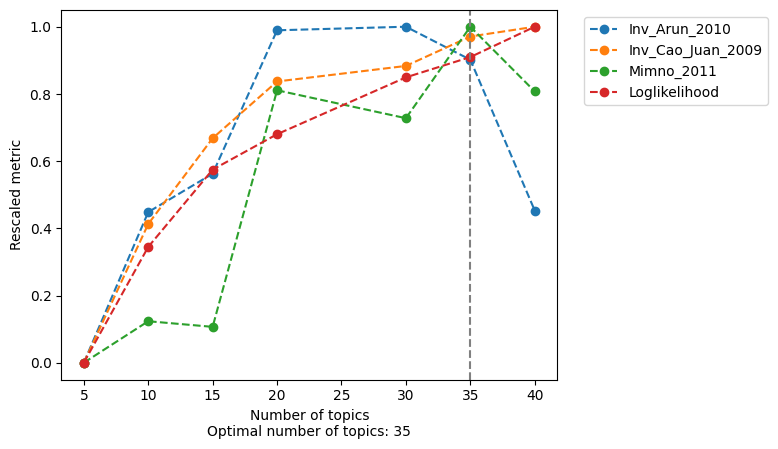

In [13]:
from pycisTopic.lda_models import evaluate_models
model = evaluate_models(
    topic_list,
    select_model = 35,
    return_model = True
)

In [7]:
cistopic_obj.add_LDA_model(model)

In [8]:
from pycisTopic.clust_vis import harmony
harmony(cistopic_obj, 
        'sample_id',
        scale = True,
        random_state = 33,
        max_iter_harmony=30)

2026-01-05 13:38:56,069 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2026-01-05 13:38:57,124 - harmonypy - INFO - sklearn.KMeans initialization complete.
2026-01-05 13:38:57,168 - harmonypy - INFO - Iteration 1 of 30
2026-01-05 13:38:59,637 - harmonypy - INFO - Iteration 2 of 30
2026-01-05 13:39:02,101 - harmonypy - INFO - Iteration 3 of 30
2026-01-05 13:39:04,615 - harmonypy - INFO - Iteration 4 of 30
2026-01-05 13:39:07,109 - harmonypy - INFO - Converged after 4 iterations


In [1]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)

In [10]:
find_clusters(
    cistopic_obj,
    harmony = True,
    target  = 'cell',
    k = 10,
    res = [0.1, 0.3, 0.5, 0.7, 0.8, 0.9, 1.0, 2.0],
    prefix = 'pycisTopic_',
    scale = True,
    split_pattern = '-'
)

2026-01-05 13:39:11,160 cisTopic     INFO     Finding neighbours
Columns ['pycisTopic_leiden_10_0.1'] will be overwritten
Columns ['pycisTopic_leiden_10_0.3'] will be overwritten
Columns ['pycisTopic_leiden_10_0.5'] will be overwritten
Columns ['pycisTopic_leiden_10_1.0'] will be overwritten
Columns ['pycisTopic_leiden_10_2.0'] will be overwritten


In [11]:
run_umap(
    cistopic_obj,
    target  = 'cell', scale=True, 
    reduction_name = 'UMAP_HARM',
    harmony=True,
    verbose=False
)

2026-01-05 13:39:32,507 cisTopic     INFO     Running UMAP


/data/leuven/347/vsc34794/miniconda3/envs/scenicplus/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


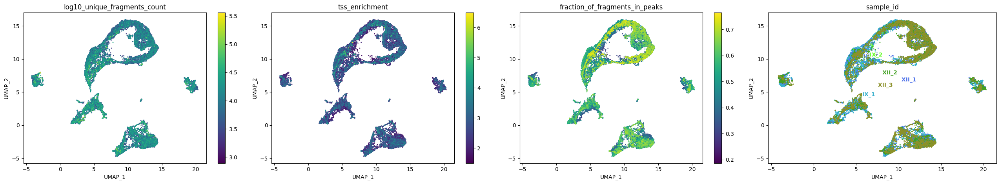

In [12]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['log10_unique_fragments_count', 'tss_enrichment', 'fraction_of_fragments_in_peaks', 'sample_id'],
    target='cell', num_columns=4,
    text_size=10,
    save='figures/paper/Figure 2/supp_UMAP_QC_values_qc_subset.png',
    dot_size=1)

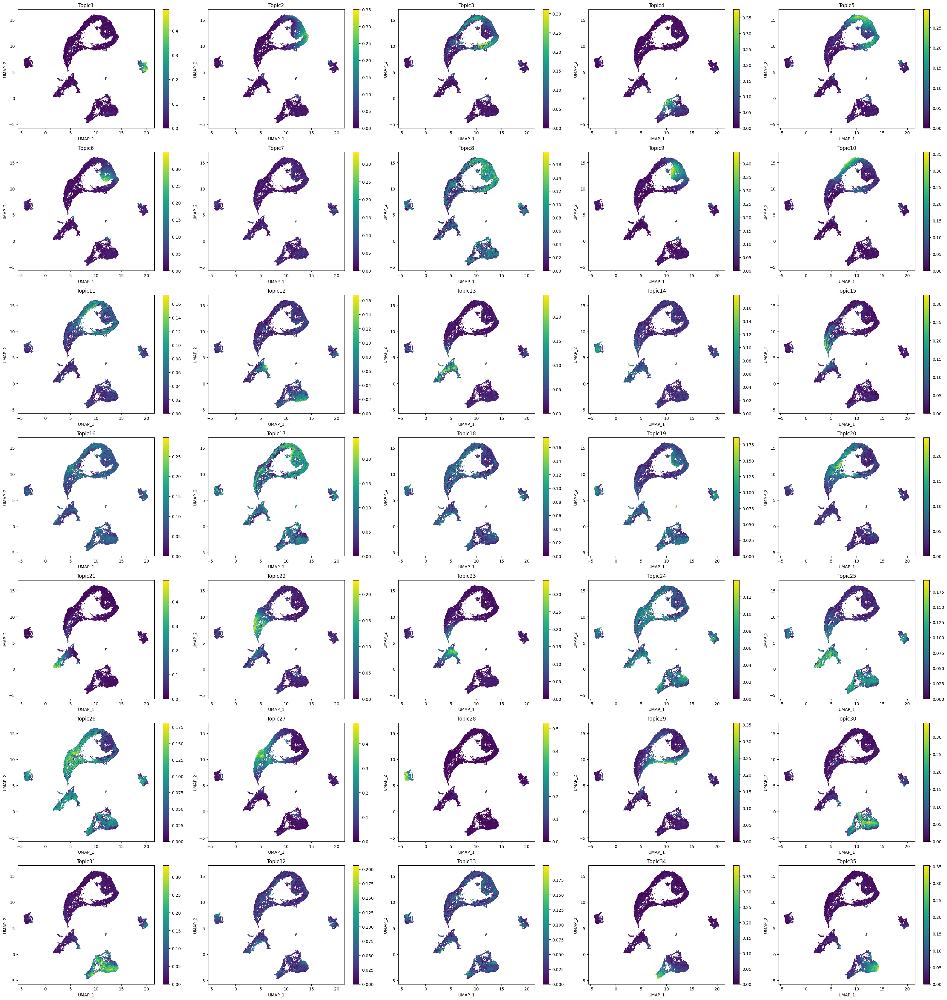

In [13]:
plot_topic(
    cistopic_obj,
    reduction_name = 'UMAP_HARM',
    target = 'cell',
    num_columns=5,
    dot_size=1
)

In [26]:
variable = 'coarse_anno'

annot_dict = {}
for resolution in [0.1, 0.3, 0.5, 0.7, 0.8, 0.9, 1.0, 2.0]:
    annot_dict[f"pycisTopic_leiden_10_{resolution}"] = {}
    for cluster in set(cistopic_obj.cell_data[f"pycisTopic_leiden_10_{resolution}"]):
        counts = cistopic_obj.cell_data.loc[
            cistopic_obj.cell_data.loc[cistopic_obj.cell_data[f"pycisTopic_leiden_10_{resolution}"] == cluster].index,
            variable].value_counts()
        annot_dict[f"pycisTopic_leiden_10_{resolution}"][cluster] = f"{counts.index[counts.argmax()]}({cluster})"


In [27]:
for resolution in [0.1, 0.3, 0.5, 0.7, 0.8, 0.9, 1.0, 2.0]:
    cistopic_obj.cell_data[f'pycisTopic_leiden_10_{resolution}'] = [
        annot_dict[f'pycisTopic_leiden_10_{resolution}'][x] for x in cistopic_obj.cell_data[f'pycisTopic_leiden_10_{resolution}'].tolist()
    ]


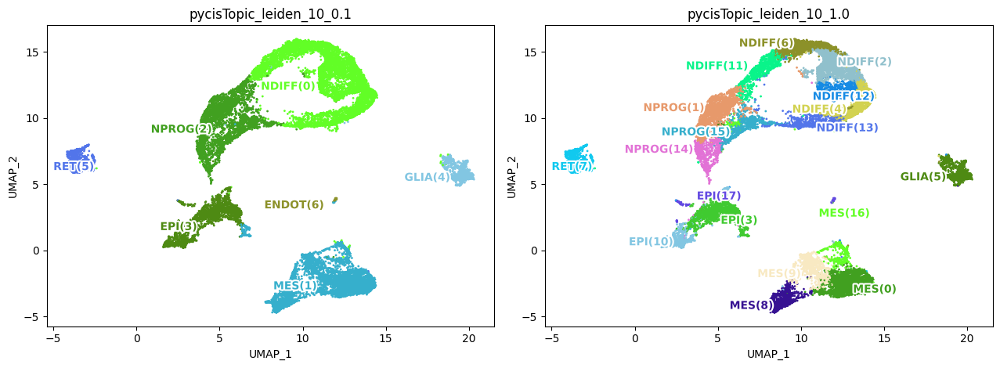

In [29]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['pycisTopic_leiden_10_0.1', 'pycisTopic_leiden_10_1.0'],
    target='cell', num_columns=4,
    text_size=10,
    save='figures/paper/Figure 2/UMAP_qc_subset_0.1_1.0.png',
    dot_size=1)

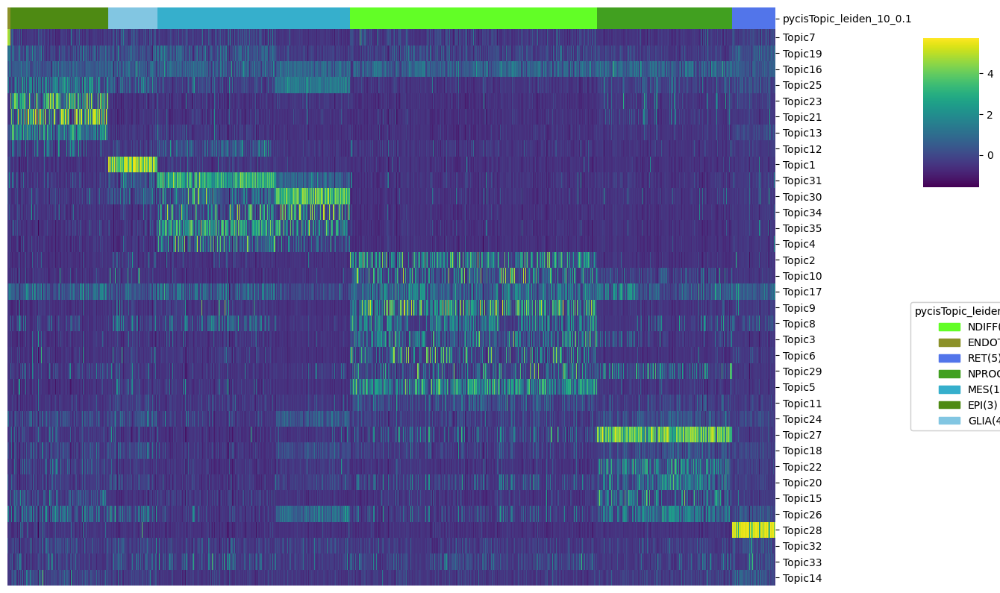

In [30]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['pycisTopic_leiden_10_0.1'],
    scale = True,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (15, 10),
    save='figures/paper/Figure 2/topic_heatmap_coarse_anno.png',
)


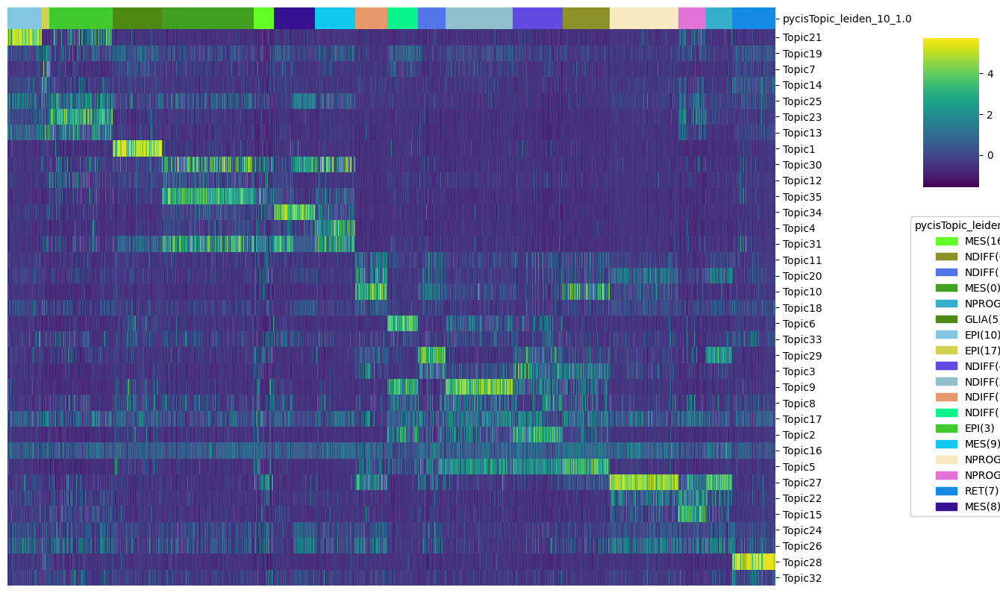

In [31]:
cell_topic_heatmap(
    cistopic_obj,
    variables = ['pycisTopic_leiden_10_1.0'],
    scale = True,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (15, 10)
)


In [109]:
variable = 'coarse_anno'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

import pickle
import os
pickle.dump(
    cistopic_obj,
    open(os.path.join(outDir, f"IX_XII_{variable}_cistopic_obj_35topics.pkl"), "wb")
)


# 12 Topic binarisation and QC

In [17]:
from pycisTopic.topic_binarization import binarize_topics

In [18]:
region_bin_topics_top_2k = binarize_topics(
    cistopic_obj, method='ntop', ntop = 2000,
    plot=False, num_columns=5
)


In [19]:
region_bin_topics_otsu = binarize_topics(
    cistopic_obj, method='otsu',
    plot=False, num_columns=5
)


In [20]:
binarized_cell_topic = binarize_topics(
    cistopic_obj,
    target='cell',
    method='li',
    plot=False,
    num_columns=5, nbins=100)


Following, we can compute the topic quality control metrics. These include:

    Number of assignments

    Topic coherence (Mimno et al., 2011): Measures to which extent high scoring regions in the topic are actually co-accessible in the original data. If it is low it indicates that the topic is rather random. The higher, the better is a topic.

    The marginal topic distribution: Indicates how much each topic contributes to the model. The higher, the better is a topic.

    The gini index: Value between 0 and 1, that indicates the specificity of topics (0: General, 1:Specific)

    If topics have been binarized, the number of regions/cells per topic will be added.


In [21]:
from pycisTopic.topic_qc import compute_topic_metrics, plot_topic_qc, topic_annotation
import matplotlib.pyplot as plt
from pycisTopic.utils import fig2img

In [22]:
topic_qc_metrics = compute_topic_metrics(cistopic_obj)

In [23]:
fig_dict={}
fig_dict['CoherenceVSAssignments']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Log10_Assignments', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['AssignmentsVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Log10_Assignments', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSCells_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Cells_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSRegions_in_bin']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Regions_in_binarized_topic', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSMarginal_dist']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Marginal_topic_dist', var_color='Gini_index', plot=False, return_fig=True)
fig_dict['CoherenceVSGini_index']=plot_topic_qc(topic_qc_metrics, var_x='Coherence', var_y='Gini_index', var_color='Gini_index', plot=False, return_fig=True)

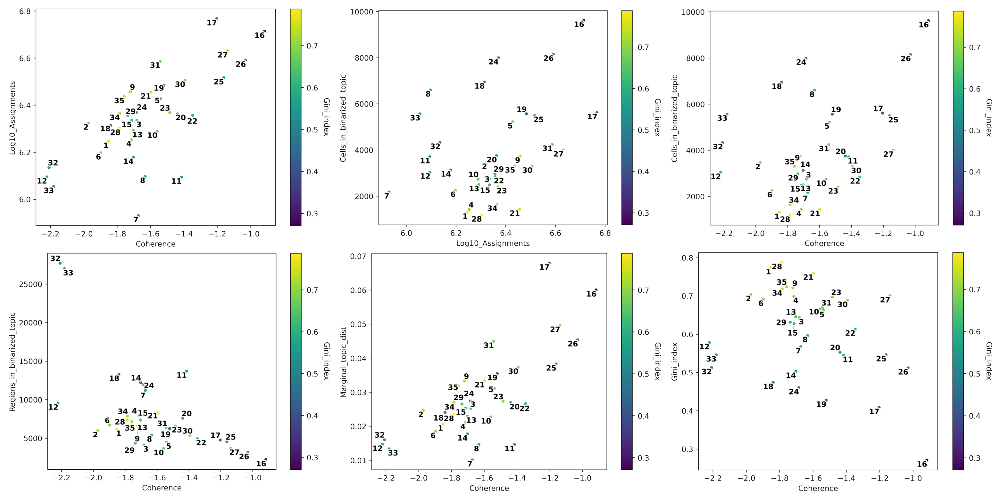

In [24]:
# Plot topic stats in one figure
fig=plt.figure(figsize=(40, 43))
i = 1
for fig_ in fig_dict.keys():
    plt.subplot(2, 3, i)
    img = fig2img(fig_dict[fig_]) #To convert figures to png to plot together, see .utils.py. This converts the figure to png.
    plt.imshow(img)
    plt.axis('off')
    i += 1
plt.subplots_adjust(wspace=0, hspace=-0.70)
plt.show()

Next, we can automatically annotate topics, in this case by cell type. Here we calculate the proportion of cells in each group that are assigned to the binarized topic in comparison to the ratio in the whole data set. We will consider a topic as general if the difference between the ration of cells in the whole data set in the binarized topic and the ratio of total cells in the assigned groups is above 0.2. This indicates that the topic is general, and the propotion test may fail if the topic is enriched in both foreground (the group) and background (the whole data set); resulting in a big difference between the ratios.

# 13 Differentially accessible regions DARs

Together with working with regulatory topics, we can also identify differentially accessible regions (DARs) between cell types. First, we will impute the region accessibility exploting the cell-topic and topic-region probabilities. To shrink very low probability values to 0, we use a scale factor (by default: 10^6).

In [35]:
from pycisTopic.diff_features import (
    impute_accessibility,
    normalize_scores,
    find_highly_variable_features,
    find_diff_features
)
import numpy as np

In [36]:
imputed_acc_obj = impute_accessibility(
    cistopic_obj,
    selected_cells=None,
    selected_regions=None,
    scale_factor=10**6
)

2026-01-05 13:48:58,709 cisTopic     INFO     Imputing region accessibility
2026-01-05 13:48:58,710 cisTopic     INFO     Impute region accessibility for regions 0-20000
2026-01-05 13:49:00,506 cisTopic     INFO     Impute region accessibility for regions 20000-40000
2026-01-05 13:49:02,296 cisTopic     INFO     Impute region accessibility for regions 40000-60000
2026-01-05 13:49:04,090 cisTopic     INFO     Impute region accessibility for regions 60000-80000
2026-01-05 13:49:05,876 cisTopic     INFO     Impute region accessibility for regions 80000-100000
2026-01-05 13:49:07,667 cisTopic     INFO     Impute region accessibility for regions 100000-120000
2026-01-05 13:49:09,451 cisTopic     INFO     Impute region accessibility for regions 120000-140000
2026-01-05 13:49:11,242 cisTopic     INFO     Impute region accessibility for regions 140000-160000
2026-01-05 13:49:13,030 cisTopic     INFO     Impute region accessibility for regions 160000-180000
2026-01-05 13:49:14,819 cisTopic     

In [37]:
variable = 'coarse_anno_qc_subset'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

import pickle
import os
pickle.dump(imputed_acc_obj,
            open(os.path.join(outDir, f"imputed_acc_obj_{variable}.pkl"), "wb"))

2026-01-05 13:50:51,627 cisTopic     INFO     Calculating mean
2026-01-05 13:50:56,538 cisTopic     INFO     Calculating variance


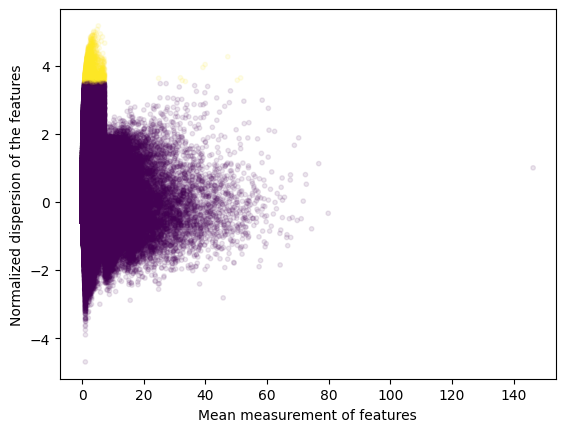

2026-01-05 14:01:31,484 cisTopic     INFO     Done!


In [38]:
variable_regions = find_highly_variable_features(
    imputed_acc_obj,
    min_disp = 0.05,
    min_mean = 0.0125,
    max_mean = 3,
    max_disp = np.inf,
    n_bins=20,
    n_top_features=2000,     # work only with top 2000 differentially accesible DARs
    plot=True
)

In [39]:
variable = 'coarse_anno_qc_subset'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

pickle.dump(variable_regions,
            open(os.path.join(outDir,f"variable_regions_{variable}.pkl"), "wb"))

In [40]:
len(variable_regions)

2000

In [41]:
markers_dict = find_diff_features(
    cistopic_obj,
    imputed_acc_obj,
    variable='pycisTopic_leiden_10_0.1',
    var_features=variable_regions,
    contrasts=None,
    adjpval_thr=0.05,
    log2fc_thr=np.log2(1.5),
    n_cpu=5,
    #_temp_dir='/scratch/leuven/330/vsc33053/ray_spill',
    split_pattern = '-'
)


2026-01-05 14:05:18,637	INFO worker.py:1724 -- Started a local Ray instance.


2026-01-05 14:05:19,223 cisTopic     INFO     Subsetting data for ENDOT(6) (93 of 21498)
2026-01-05 14:05:22,928 cisTopic     INFO     Computing p-value for ENDOT(6)
2026-01-05 14:05:28,277 cisTopic     INFO     Computing log2FC for ENDOT(6)
2026-01-05 14:05:29,596 cisTopic     INFO     ENDOT(6) done!
2026-01-05 14:05:29,603 cisTopic     INFO     Subsetting data for EPI(3) (2734 of 21498)
2026-01-05 14:05:29,611 cisTopic     INFO     Computing p-value for EPI(3)
2026-01-05 14:05:31,824 cisTopic     INFO     Computing log2FC for EPI(3)
2026-01-05 14:05:31,839 cisTopic     INFO     EPI(3) done!
2026-01-05 14:05:31,846 cisTopic     INFO     Subsetting data for GLIA(4) (1366 of 21498)
2026-01-05 14:05:31,877 cisTopic     INFO     Computing p-value for GLIA(4)
2026-01-05 14:05:33,797 cisTopic     INFO     Computing log2FC for GLIA(4)
2026-01-05 14:05:33,803 cisTopic     INFO     GLIA(4) done!
2026-01-05 14:05:33,810 cisTopic     INFO     Subsetting data for MES(1) (5391 of 21498)
2026-01-05

In [42]:
variable = 'coarse_anno_qc_subset'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

import pickle
import os
pickle.dump(markers_dict,
            open(os.path.join(outDir, f"markers_dict_leiden0.1_{variable}.pkl"), "wb"))

In [1]:
# check region accessibility of the top DAR per cluster on the cell-topic UMAP

In [44]:
from pycisTopic.clust_vis import plot_imputed_features

In [45]:
markers_dict.keys()

dict_keys(['ENDOT(6)', 'EPI(3)', 'GLIA(4)', 'MES(1)', 'NDIFF(0)', 'NPROG(2)', 'RET(5)'])

In [89]:
[markers_dict[x].index.tolist()[0] for x in ['ENDO(21)']]

['xcOctVulg1.1_chr28:13407568-13408068']

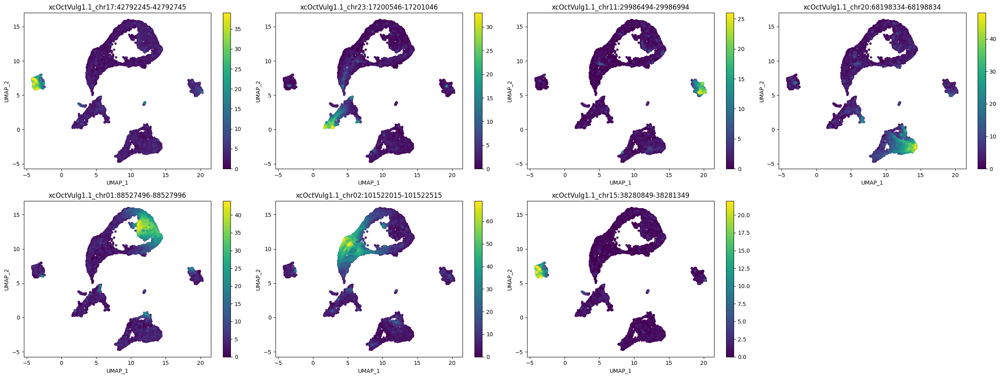

In [46]:
plot_imputed_features(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    imputed_data=imputed_acc_obj,
    features=[markers_dict[x].index.tolist()[0] for x in ['ENDOT(6)', 'EPI(3)', 'GLIA(4)', 'MES(1)', 'NDIFF(0)', 'NPROG(2)', 'RET(5)']],
    scale=False,
    num_columns=4
)

# 14 Save Regions Set

In [ ]:
variable='coarse_anno'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

os.makedirs(os.path.join(outDir, f"region_sets_{variable}"), exist_ok = True)
os.makedirs(os.path.join(outDir, f"region_sets_{variable}", "Topics_otsu"), exist_ok = True)
os.makedirs(os.path.join(outDir, f"region_sets_{variable}", "Topics_top_2k"), exist_ok = True)
os.makedirs(os.path.join(outDir, f"region_sets_{variable}", f"DARs_{variable}_leiden0.1"), exist_ok = True)

In [ ]:
print(os.path.join(outDir, f"region_sets_{variable}"))

/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/region_sets_coarse_anno


In [ ]:
ls /staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/region_sets_coarse_anno

DARs_coarse_anno_leiden0.1/  Topics_otsu/  Topics_top_2k/


In [ ]:
from pycisTopic.utils import region_names_to_coordinates

In [52]:
for topic in region_bin_topics_otsu:
    region_names_to_coordinates(
        region_bin_topics_otsu[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(outDir, f"region_sets_{variable}", "Topics_otsu", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [53]:
for topic in region_bin_topics_top_2k:
    region_names_to_coordinates(
        region_bin_topics_top_2k[topic].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(outDir, f"region_sets_{variable}", "Topics_top_2k", f"{topic}.bed"),
        sep = "\t",
        header = False, index = False
    )

In [62]:
markers_dict = pickle.load(open("/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/markers_dict_leiden0.1_coarse_anno_qc_subset.pkl", "rb"))

variable='coarse_anno'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

for cell_type in markers_dict:
    region_names_to_coordinates(
        markers_dict[cell_type].index
    ).sort_values(
        ["Chromosome", "Start", "End"]
    ).to_csv(
        os.path.join(outDir, f"region_sets_{variable}", f"DARs_{variable}_leiden0.1", f"{cell_type}.bed"),
        sep = "\t",
        header = False, index = False
    )

In this function there are several options to evaluate: - Search space: The user can choose whether the search space should be include other genes or not (use_gene_boundaries), and the minimum and maximum distance it should have (upstream and downstream) - Distance weight: The parameters related to the distance weight measure the impact of distance when inferring region to gene weights as an exponential function. The user can control whether this weight should be used (distance_weight) and the effect of the distance (decay_rate). - Gene size weight: Large genes may have more peaks by chance. The user can optionally apply a weight based on the size of each gene (gene_size_weight), which by default is dividing the size of each gene by the median gene size in the genome. Alternatively, the user can also use average_scores which will calculate the gene activity as the mean weighted region accessibility of all regions linked to the gene. - Gini weight: This weight will give more importance to specific regions (gini_weight).

# 15 Plotting

In [1]:
variable = 'coarse_anno'
outDir = '/staging/leuven/stg_00171/Mark/IX_XII_MP_integration/pycistopic_papero/'

import pickle
import os

infile = open(os.path.join(outDir, f"IX_XII_{variable}_cistopic_obj_35topics.pkl"), "rb")
cistopic_obj = pickle.load(infile)
infile.close()

In [2]:
from pycisTopic.clust_vis import (
    find_clusters,
    run_umap,
    run_tsne,
    plot_metadata,
    plot_topic,
    cell_topic_heatmap
)

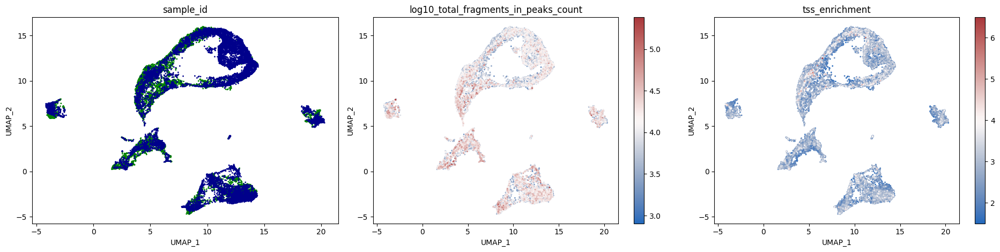

In [95]:
color_dic = {'sample_id': 
             {
                 'IX_1': 'green',
                 'IX_2': 'green',
                 'XII_1': 'darkblue',
                 'XII_2': 'darkblue',
                 'XII_3': 'darkblue'
             }
            }

plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['sample_id', 'log10_total_fragments_in_peaks_count', 'tss_enrichment'],
    target='cell', 
    num_columns=4,
    text_size=10,
    cmap='vlag',
    show_label=False,
    color_dictionary=color_dic,
    #save= 'figures/paper/UMAP_sample_QC.png',
    dot_size=1)

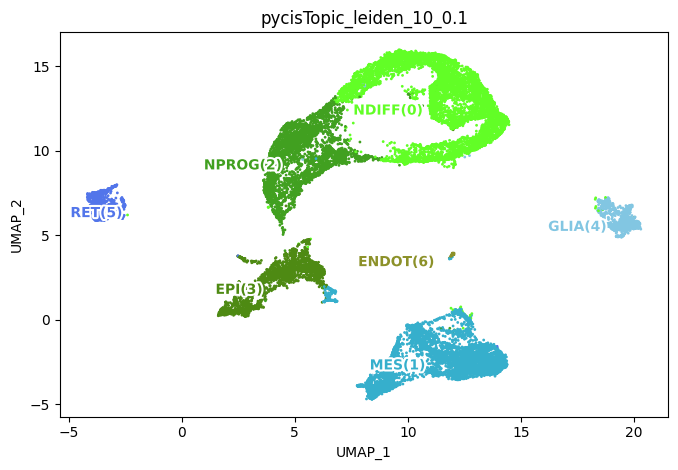

In [96]:
plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['pycisTopic_leiden_10_0.1'],
    target='cell', 
    num_columns=4,
    text_size=10,
    cmap='vlag',
    show_label=True,
    color_dictionary=color_dic,
    #save= 'figures/paper/pycistopic_UMAP_leiden_0.3.png',
    dot_size=1)

In [99]:
replace = {
'MES(1)': 'MES',
'EPI(3)': 'EPI',
'GLIA(4)': 'GLIA',
'ENDOT(6)': 'ENDO',
'NPROG(2)': 'NPROG',
'NDIFF(0)': 'NDIFF',
'RET(5)': 'RET'
}

cistopic_obj.cell_data['ATAC_coarse'] = cistopic_obj.cell_data['pycisTopic_leiden_10_0.1'].replace(replace)

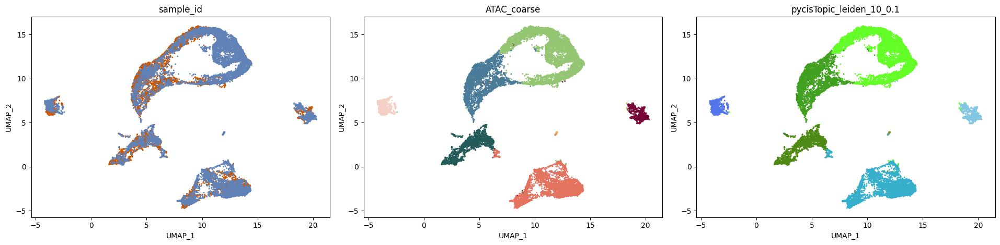

In [106]:
color_dic = {'ATAC_coarse': {
                'MES': '#E3735E',
                'EPI': '#235a5a',
                'GLIA': '#770737',
                'NPROG': '#4a7c99',
                'NDIFF': '#93C572',
                'RET': '#F3CFC6',
                'ENDO': '#eeaf61'
            },
             'sample_id': 
             {
                 'IX_1': '#CC5500',
                 'IX_2': '#CC5500',
                 'XII_1': '#6082B6',
                 'XII_2': '#6082B6',
                 'XII_3': '#6082B6'
             }
            }

plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['sample_id', 'ATAC_coarse', 'pycisTopic_leiden_10_0.1'],
    target='cell', 
    num_columns=4,
    text_size=10,
    cmap='vlag',
    show_label=False,
    color_dictionary=color_dic,
    save= 'figures/paper/Figure 2/qc_subset_UMAP_ATAC_coarse_sampleID.png',
    dot_size=1)

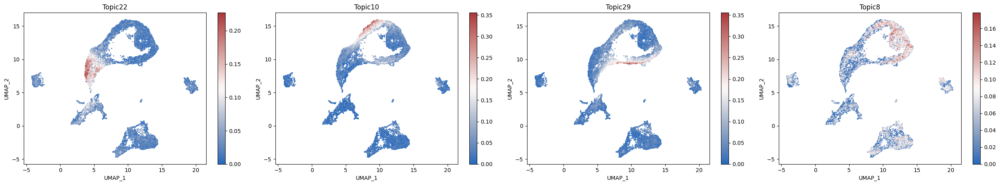

In [6]:
plot_topic(
    cistopic_obj,
    reduction_name = 'UMAP_HARM',
    target = 'cell',
    num_columns=5,
    selected_topics=[22,10,29,8],
    cmap='vlag',
    dot_size=1,
    save = 'figures/paper/Figure 2/pycistopic_topic22_10_29_8.png'
)

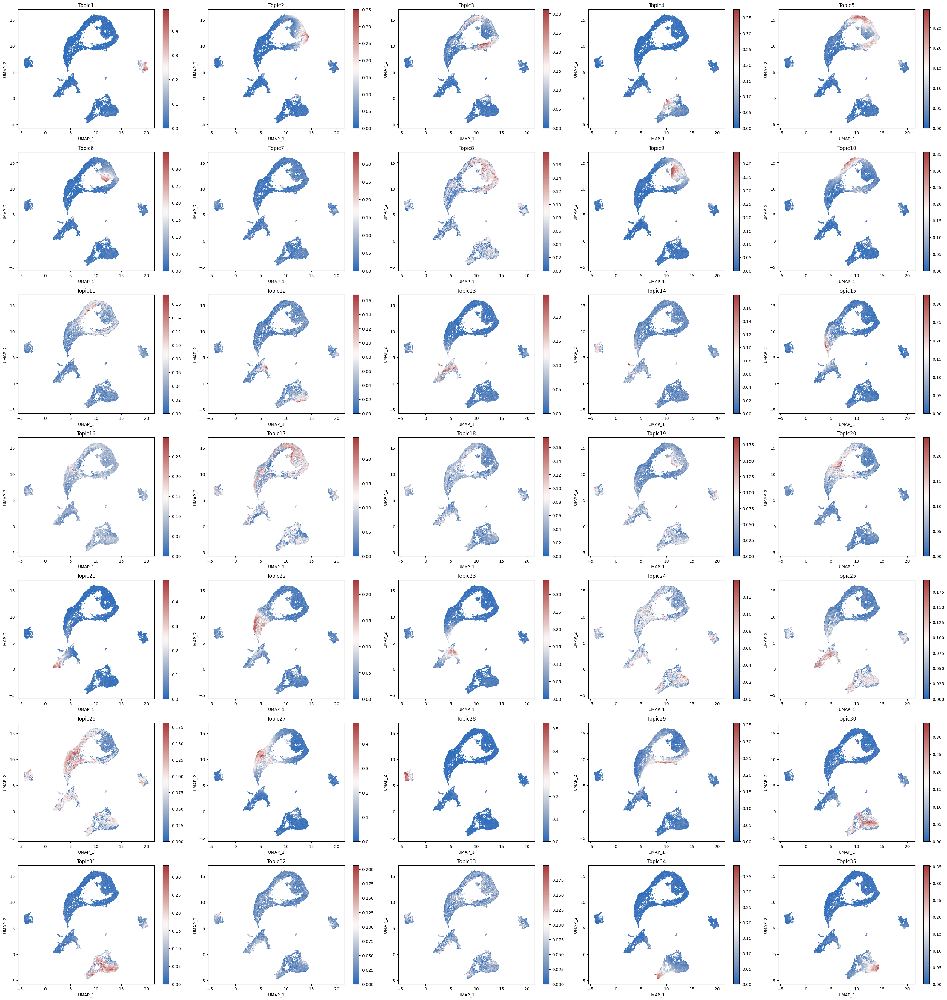

In [105]:
plot_topic(
    cistopic_obj,
    reduction_name = 'UMAP_HARM',
    target = 'cell',
    num_columns=5,
    cmap='vlag',
    dot_size=1,
    #save = 'figures/paper/pycistopic_50Topics.png'
)

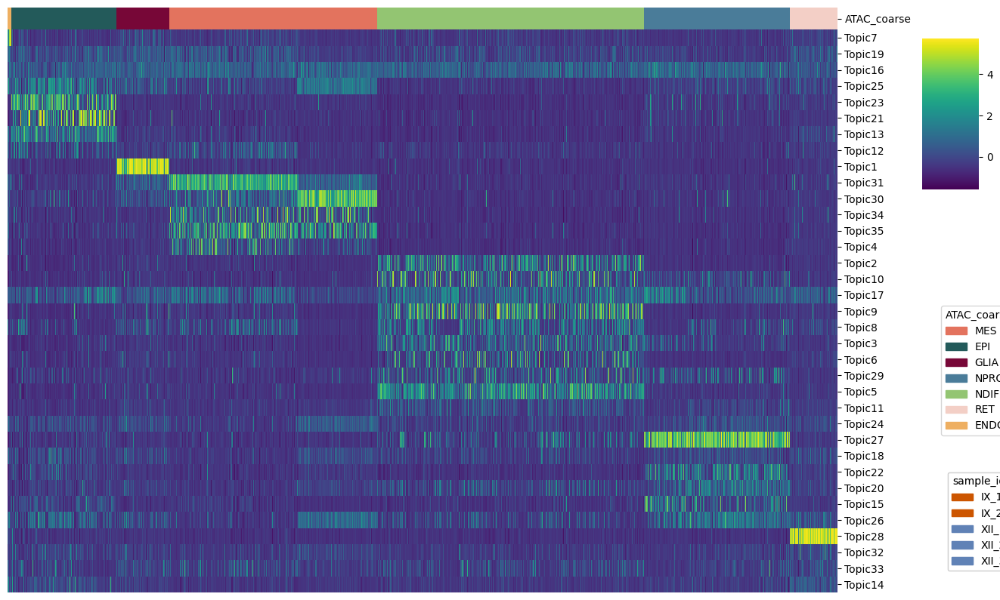

In [108]:
color_dic = {'ATAC_coarse': {
                'MES': '#E3735E',
                'EPI': '#235a5a',
                'GLIA': '#770737',
                'NPROG': '#4a7c99',
                'NDIFF': '#93C572',
                'RET': '#F3CFC6',
                'ENDO': '#eeaf61'
            },
             'sample_id': 
             {
                 'IX_1': '#CC5500',
                 'IX_2': '#CC5500',
                 'XII_1': '#6082B6',
                 'XII_2': '#6082B6',
                 'XII_3': '#6082B6'
             }
            }

cell_topic_heatmap(
    cistopic_obj,
    variables = ['ATAC_coarse'],
    scale = True,
    legend_loc_x = 1.0,
    legend_loc_y = -1.2,
    legend_dist_y = -1,
    figsize = (15, 10),
    color_dictionary=color_dic,
    save='figures/paper/Figure 2/topics_per_cluster_ATACcoarse.png'
)


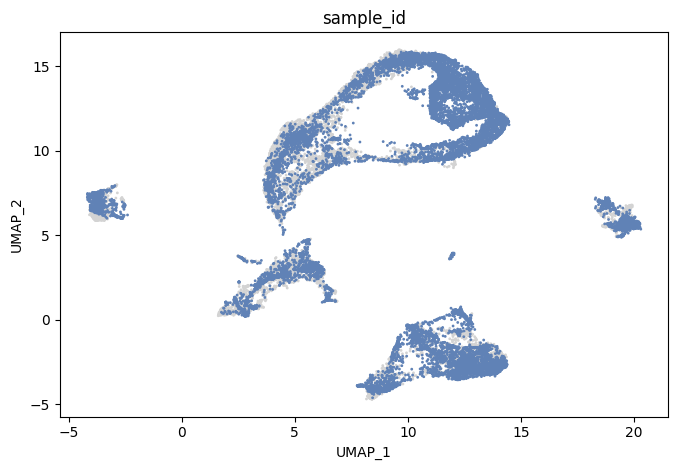

In [10]:
color_dic = {'ATAC_coarse': {
                'MES': '#E3735E',
                'EPI': '#235a5a',
                'GLIA': '#770737',
                'NPROG': '#4a7c99',
                'NDIFF': '#93C572',
                'RET': '#F3CFC6',
                'ENDO': '#eeaf61'
            },
             'sample_id': 
             {
                 'IX_1': '#CC5500',
                 'IX_2': '#CC5500',
                 'XII_1': '#6082B6',
                 'XII_2': '#6082B6',
                 'XII_3': '#6082B6'
             }
            }

highlight_dic = {'ATAC_coarse': {
                'MES': '#D3D3D3',
                'EPI': '#D3D3D3',
                'GLIA': '#770737',
                'NPROG': '#D3D3D3',
                'NDIFF': '#D3D3D3',
                'RET': '#D3D3D3',
                'ENDO': '#D3D3D3'
            },
             'sample_id': 
             {
                 'IX_1': '#D3D3D3',
                 'IX_2': '#D3D3D3',
                 'XII_1': '#6082B6',
                 'XII_2': '#6082B6',
                 'XII_3': '#6082B6'
             }
            }

plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['sample_id'],
    target='cell', 
    num_columns=4,
    text_size=10,
    cmap='vlag',
    show_label=False,
    color_dictionary=highlight_dic,
    save= 'figures/paper/Figure 2/qc_subset_UMAP_XII.png',
    dot_size=1)

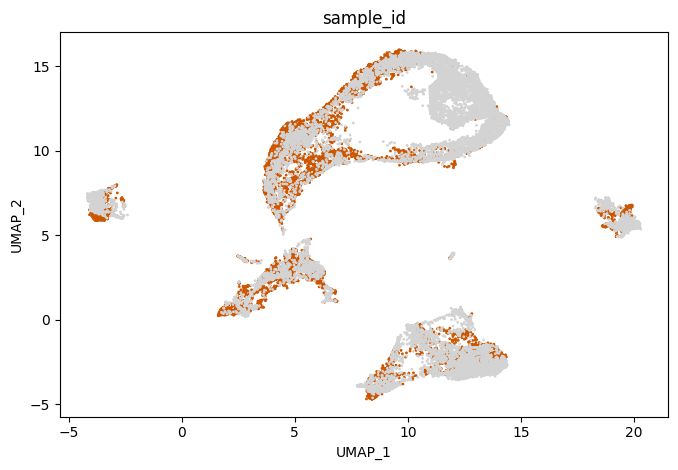

In [11]:
color_dic = {'ATAC_coarse': {
                'MES': '#E3735E',
                'EPI': '#235a5a',
                'GLIA': '#770737',
                'NPROG': '#4a7c99',
                'NDIFF': '#93C572',
                'RET': '#F3CFC6',
                'ENDO': '#eeaf61'
            },
             'sample_id': 
             {
                 'IX_1': '#CC5500',
                 'IX_2': '#CC5500',
                 'XII_1': '#6082B6',
                 'XII_2': '#6082B6',
                 'XII_3': '#6082B6'
             }
            }

highlight_dic = {'ATAC_coarse': {
                'MES': '#D3D3D3',
                'EPI': '#D3D3D3',
                'GLIA': '#770737',
                'NPROG': '#D3D3D3',
                'NDIFF': '#D3D3D3',
                'RET': '#D3D3D3',
                'ENDO': '#D3D3D3'
            },
             'sample_id': 
             {
                 'IX_1': '#CC5500',
                 'IX_2': '#CC5500',
                 'XII_1': '#D3D3D3',
                 'XII_2': '#D3D3D3',
                 'XII_3': '#D3D3D3'
             }
            }

plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['sample_id'],
    target='cell', 
    num_columns=4,
    text_size=10,
    cmap='vlag',
    show_label=False,
    color_dictionary=highlight_dic,
    save= 'figures/paper/Figure 2/qc_subset_UMAP_IX.png',
    dot_size=1)

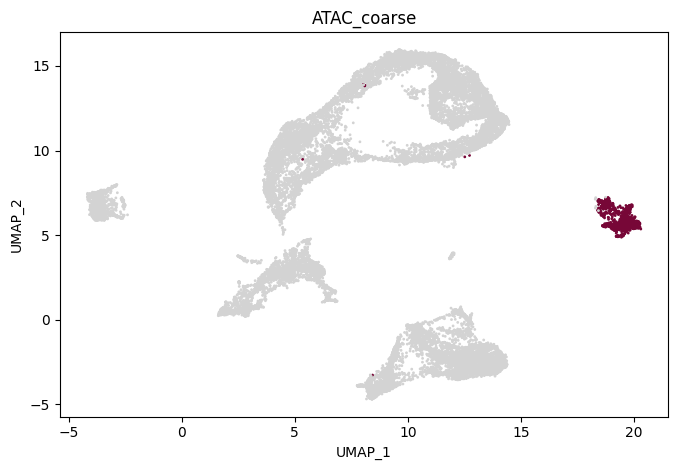

In [3]:
highlight_dic = {'ATAC_coarse': {
                'MES': '#D3D3D3',
                'EPI': '#D3D3D3',
                'GLIA': '#770737',
                'NPROG': '#D3D3D3',
                'NDIFF': '#D3D3D3',
                'RET': '#D3D3D3',
                'ENDO': '#D3D3D3'
            },
             'sample_id': 
             {
                 'IX_1': '#CC5500',
                 'IX_2': '#CC5500',
                 'XII_1': '#D3D3D3',
                 'XII_2': '#D3D3D3',
                 'XII_3': '#D3D3D3'
             }
            }

plot_metadata(
    cistopic_obj,
    reduction_name='UMAP_HARM',
    variables=['ATAC_coarse'],
    target='cell', 
    num_columns=4,
    text_size=10,
    cmap='vlag',
    show_label=False,
    color_dictionary=highlight_dic,
    save= 'figures/paper/Figure 6/qc_subset_UMAP_GLIA_highlight.pdf',
    dot_size=1)